## import packages

In [1]:
! pip install --upgrade seaborn
! pip install optuna
! pip install lazypredict
! pip install ydata_profiling

# import essential libraries
import optuna
import sklearn
import imblearn
import math
import numpy as np
import pandas as pd
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
import tensorflow as tf
import matplotlib.pyplot as plt
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.neural_network import MLPClassifier
from lazypredict.Supervised import LazyClassifier
import xgboost as xgb
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import cross_val_score
import pandas_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 5.6 MB/s eta 0:00:00
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 18.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=f7290f59da488900c4c02d44fd9905be5fcc94965c57902d5dee7471

In [2]:
# plotting style
plt.style.use('https://github.com/dhaitz/matplotlib-stylesheets/raw/master/pacoty.mplstyle')

# Import data

In [3]:
# read dataset
data = pd.read_csv('Hotel Reservations.csv')

data.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [5]:
# Get a whole view of dataset using pandas_profiling package

profile = pandas_profiling.ProfileReport(data)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### check if there are NaN values in dataset


In [6]:
data.isnull().sum()

Booking_ID                              0
no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

## data describe

In [7]:
data.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00,36275.00
mean,1.84,0.11,0.81,2.20,0.03,85.23,2017.82,7.42,15.60,0.03,0.02,0.15,103.42,0.62
std,0.52,0.40,0.87,1.41,0.17,85.93,0.38,3.07,8.74,0.16,0.37,1.75,35.09,0.79
min,0.00,0.00,0.00,0.00,0.00,0.00,2017.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00
25%,2.00,0.00,0.00,1.00,0.00,17.00,2018.00,5.00,8.00,0.00,0.00,0.00,80.30,0.00
50%,2.00,0.00,1.00,2.00,0.00,57.00,2018.00,8.00,16.00,0.00,0.00,0.00,99.45,0.00
75%,2.00,0.00,2.00,3.00,0.00,126.00,2018.00,10.00,23.00,0.00,0.00,0.00,120.00,1.00
max,4.00,10.00,7.00,17.00,1.00,443.00,2018.00,12.00,31.00,1.00,13.00,58.00,540.00,5.00


# Type of the parameters
## I - Continuous
1. `lead_time`
2. `avg_price_per_room`

## II - Categorical
1. `type_of_meal_plan`
2. `room_type_reserved`
3. `market_segment_type`
4. `repeated_guest`
5. `required_car_parking_space`

## III - Non-categorical
1. `no_of_adults`
2. `no_of_children`
3. `no_of_weekend_nights`
4. `no_of_week_nights`
5. `arrival_year`
6. `arrival_month`
7. `arrival_date`
8. `no_of_previous_cancellations`
9. `no_of_previous_bookings_not_canceled`
10. `no_of_special_requests`

In [4]:
# list all of the labels based on parameter types

continuous = ['lead_time', 'avg_price_per_room']

categorical = ['type_of_meal_plan', 'room_type_reserved', 'market_segment_type',
               'repeated_guest', 'required_car_parking_space']

non_categorical = ['no_of_adults', 'no_of_children', 'no_of_weekend_nights',
                   'no_of_week_nights', 'arrival_year', 'arrival_month',
                   'arrival_date', 'no_of_previous_cancellations',
                   'no_of_previous_bookings_not_canceled',
                   'no_of_special_requests']

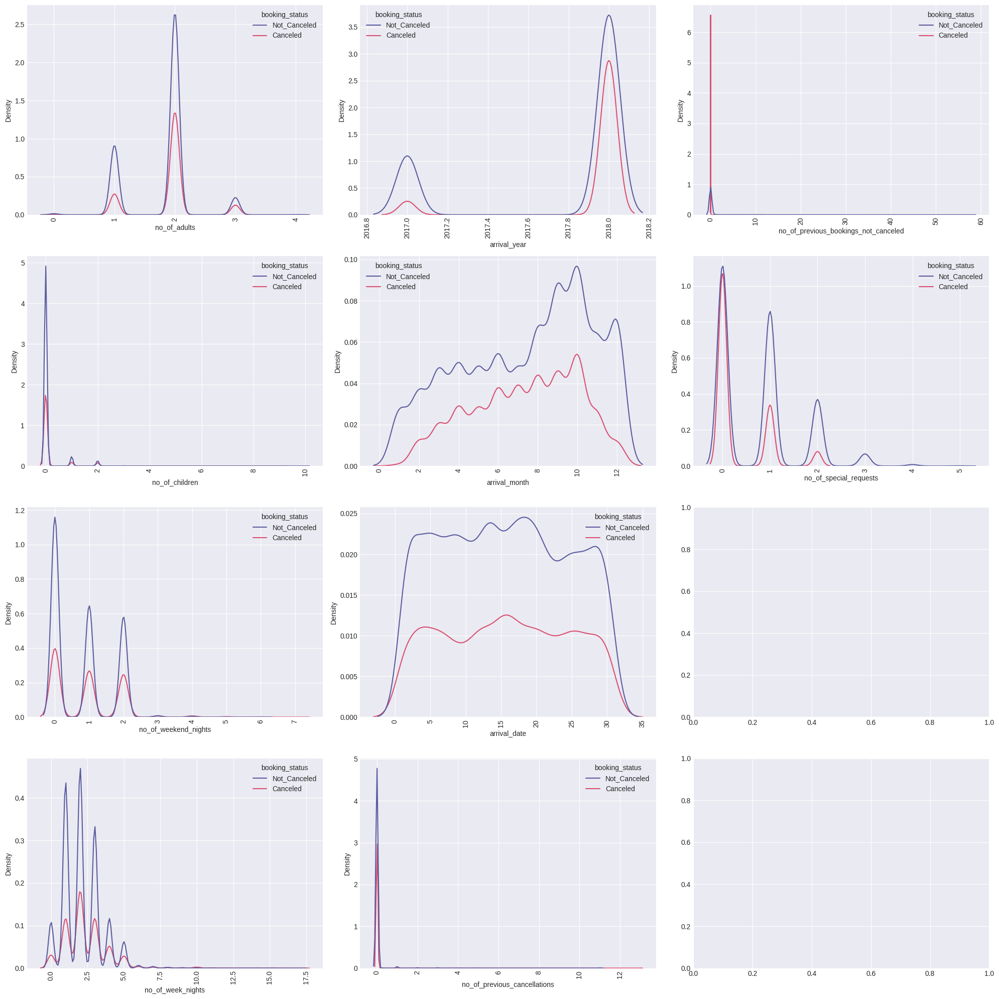

In [9]:
# Draw the charts of non_categorical attibutes

fig, ax = plt.subplots(4, math.ceil(len(non_categorical)/4) , figsize=(20, 20))

for i, label in enumerate(non_categorical):
    chart = sns.kdeplot(data=data, x=label, hue='booking_status',
                         ax=ax[i%4][int(i/4)])
    plt.setp(chart.get_xticklabels(), rotation = 90)

fig.tight_layout()

In [5]:
# Transform , delete or combine features :

# generate quarters
conditions = [
    (data['arrival_month'] <= 3),
    (data['arrival_month'] > 3) & (data['arrival_month'] <= 6),
    (data['arrival_month'] > 6) & (data['arrival_month'] <= 9),
    (data['arrival_month'] >= 10)
]
values = [ 1,2, 3, 4]
values_num = [1 , 2, 3, 4]
data['quarter'] = np.select(conditions, values)


data['no_of_people'] = data['no_of_adults'] + data['no_of_children']
data['no_of_nights'] = data['no_of_week_nights'] + data['no_of_weekend_nights']
data['has_special_requests'] = data['no_of_special_requests'] > 1.

categorical.append('has_special_requests')

data.drop(columns=['arrival_date', 'arrival_month','no_of_week_nights', 'no_of_weekend_nights',
                            'no_of_adults', 'no_of_children', 'Booking_ID'], inplace=True)


non_categorical = ['no_of_people' , 'no_of_nights', 'arrival_year', 'quarter',
                   'no_of_previous_cancellations',
                   'no_of_previous_bookings_not_canceled',
                   'no_of_special_requests']


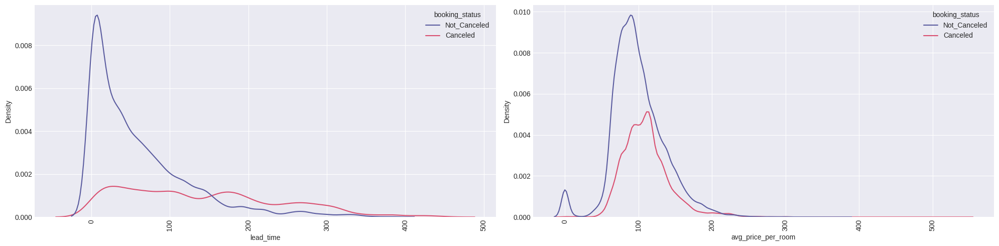

In [11]:

fig, ax = plt.subplots(1,2 , figsize=(20, 5))

for i, label in enumerate(continuous):
    chart = sns.kdeplot(data=data, x=label, hue='booking_status',
                         ax=ax[i])
    plt.setp(chart.get_xticklabels(), rotation = 90)

fig.tight_layout()

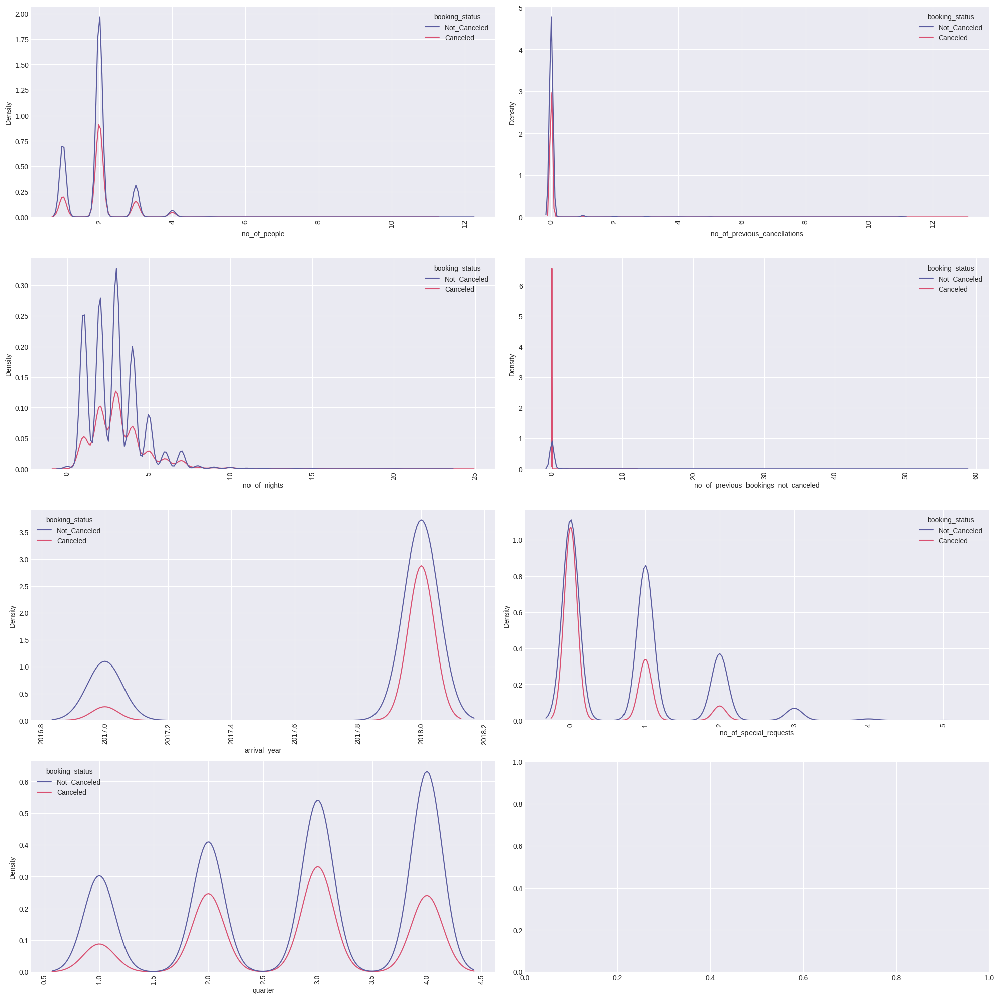

In [12]:
# Draw the charts of non_categorical attibutes

fig, ax = plt.subplots(4, math.ceil(len(non_categorical)/4) , figsize=(20, 20))

for i, label in enumerate(non_categorical):
    chart = sns.kdeplot(data=data, x=label, hue='booking_status',
                         ax=ax[i%4][int(i/4)])
    plt.setp(chart.get_xticklabels(), rotation = 90)

fig.tight_layout()

<Axes: xlabel='avg_price_per_room', ylabel='booking_status'>

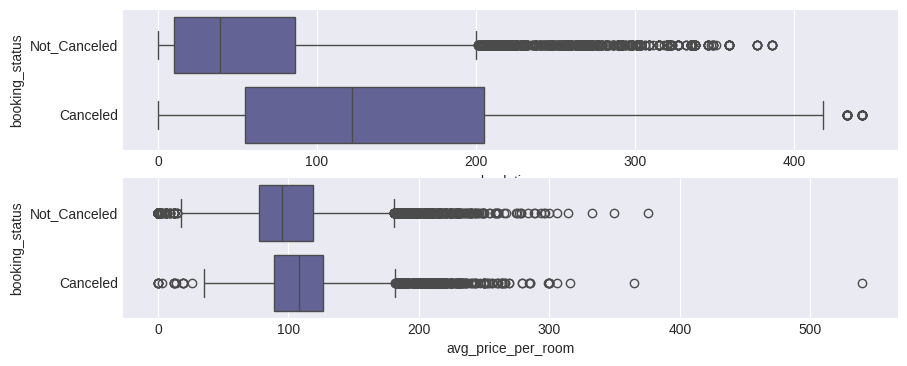

In [13]:
fig, (ax_box, ax_box2) = plt.subplots(2, 1,
                                      figsize=(10, 4) )
sns.boxplot(data=data, x='lead_time', y='booking_status', ax=ax_box, orient='h')
sns.boxplot(data=data, x='avg_price_per_room', y='booking_status', ax=ax_box2, orient='h')

## Processing Continious Attributes

In [6]:
def remove_outliers(df, label):
    q1 = df[label].quantile(0.25)
    q3 = df[label].quantile(0.75)
    iqr = (q3 - q1)
    fil = (df[label] >= q1 - 1.5 * iqr) & (df[label] <= q3 + 1.5 * iqr)
    return df.loc[fil]

for lead_time : A good pattern is observed in this histogram. Canceled distribution is clearly more uniform compared to Not_Canceled distribution.
for avg price per room :Unlike the lead_time, distributions are almost the same in each booking_status. There is also a huge number of outliers here.


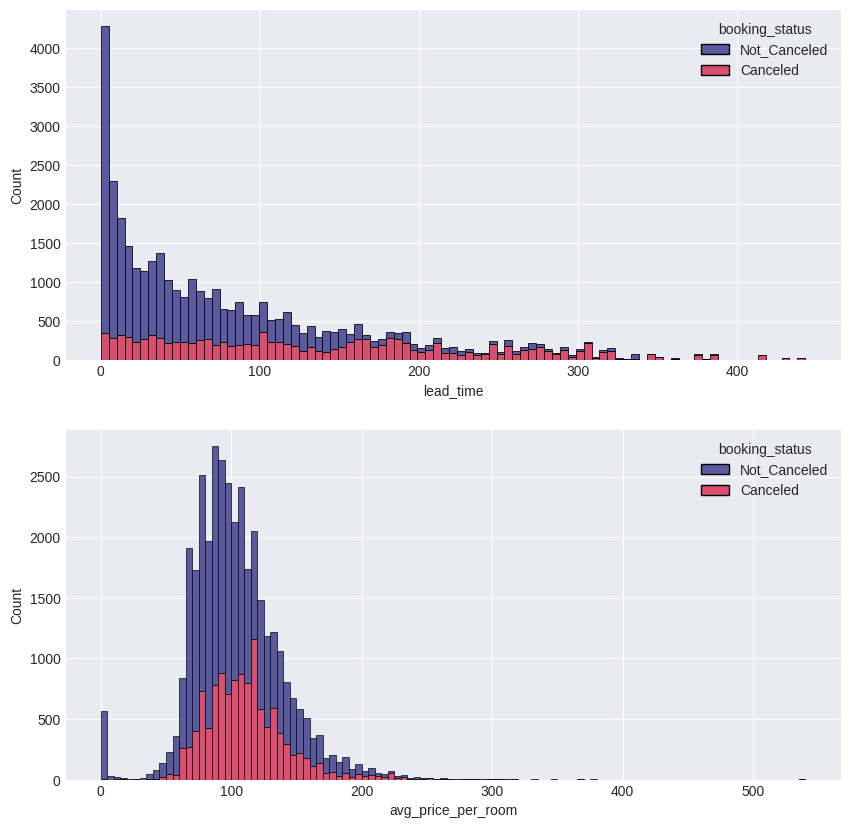

In [10]:
def histplot_continious_attr(_data):
    ## Histogram
    binwidth = {
        'lead_time': 5, # 5 days
        'avg_price_per_room': 5. # 10$
    }

    fig, (ax_hist , ax_hist2) = plt.subplots(2, 1,  figsize=(10, 10) , gridspec_kw={"height_ratios": (1, 1)})

    sns.histplot(data=_data, x='lead_time', ax=ax_hist,
                 binwidth=binwidth['lead_time'], hue="booking_status",
                 multiple='stack', alpha=1.)

    sns.histplot(data=_data, x='avg_price_per_room', ax=ax_hist2,
                 binwidth=binwidth['avg_price_per_room'], hue="booking_status",
                 multiple='stack', alpha=1.)

    print('for lead_time : A good pattern is observed in this histogram. Canceled distribution is clearly more uniform compared to Not_Canceled distribution.')
    print('for avg price per room :Unlike the lead_time, distributions are almost the same in each booking_status. There is also a huge number of outliers here.')

histplot_continious_attr(data)

## remove outlier function for continous Attributes


for lead_time : A good pattern is observed in this histogram. Canceled distribution is clearly more uniform compared to Not_Canceled distribution.
for avg price per room :Unlike the lead_time, distributions are almost the same in each booking_status. There is also a huge number of outliers here.


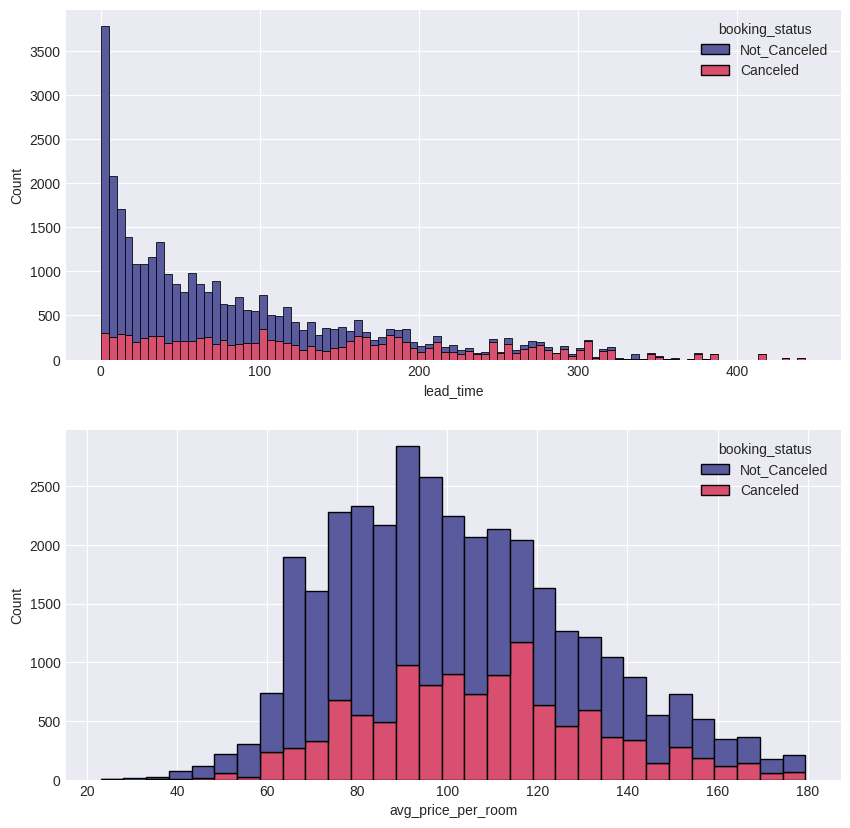

In [11]:
# Remove Outliers from avg_price_per_room

data_encode2 = data.copy()

# data_encode2 = remove_outliers(data, 'lead_time')
data_encode2 = remove_outliers(data, 'avg_price_per_room')


histplot_continious_attr(data_encode2)

<Axes: xlabel='avg_price_per_room', ylabel='booking_status'>

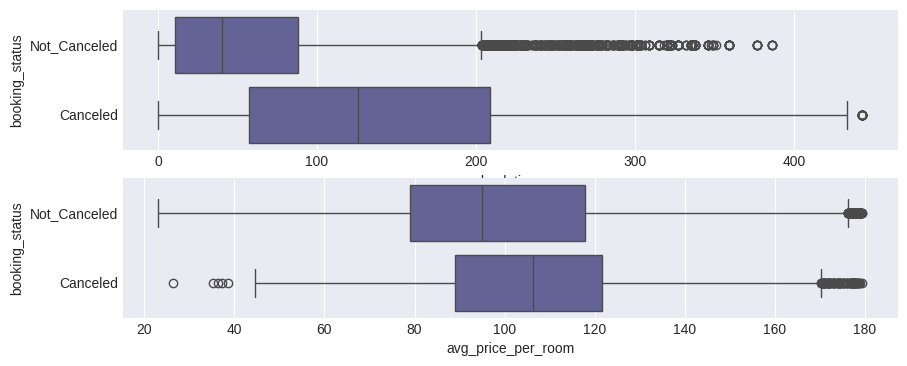

In [17]:
fig, (ax_box, ax_box2) = plt.subplots(2, 1,
                                      figsize=(10, 4) )
sns.boxplot(data=data_encode2, x='lead_time', y='booking_status', ax=ax_box, orient='h')
sns.boxplot(data=data_encode2, x='avg_price_per_room', y='booking_status', ax=ax_box2, orient='h')

In [12]:
# Standardization

scaler = StandardScaler()

standardized_data = scaler.fit_transform(data_encode2[continuous])
standardized_df = pd.DataFrame(standardized_data, columns=data[continuous].columns)
standardized_df = standardized_df.join(data[categorical + non_categorical  + ['booking_status']])
standardized_df

,lead_time,avg_price_per_room,type_of_meal_plan,room_type_reserved,market_segment_type,repeated_guest,required_car_parking_space,has_special_requests,no_of_people,no_of_nights,arrival_year,quarter,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,no_of_special_requests,booking_status
0,1.58,-1.36,Meal Plan 1,Room_Type 1,Offline,0,0,False,2,3,2017,4,0,0,0,Not_Canceled
1,-0.95,0.17,Not Selected,Room_Type 1,Online,0,0,False,2,5,2018,4,0,0,1,Not_Canceled
2,-1.00,-1.54,Meal Plan 1,Room_Type 1,Online,0,0,False,1,3,2018,1,0,0,0,Canceled
3,1.43,-0.08,Meal Plan 1,Room_Type 1,Online,0,0,False,2,2,2018,2,0,0,0,Canceled
4,-0.46,-0.28,Not Selected,Room_Type 1,Online,0,0,False,2,2,2018,2,0,0,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34574,-0.03,2.40,Meal Plan 1,Room_Type 4,Online,0,0,False,2,4,2018,2,0,0,0,Canceled
34575,1.62,-0.41,Not Selected,Room_Type 1,Online,0,0,False,2,3,2018,2,0,0,1,Not_Canceled
34576,0.70,-0.14,Meal Plan 2,Room_Type 1,Offline,0,0,False,2,3,2018,3,0,0,0,Canceled
34577,-0.28,-0.28,Meal Plan 1,Room_Type 1,Online,0,0,False,3,5,2018,3,0,0,1,Not_Canceled


# Processing Categorical Attributes

In [13]:
# Changing the values of some columns to see more readable chart

standardized_df['repeated_guest'].replace(0, "No", inplace=True)
standardized_df['repeated_guest'].replace(1, "Yes", inplace=True)

standardized_df['required_car_parking_space'].replace(0, "No", inplace=True)
standardized_df['required_car_parking_space'].replace(1, "Yes", inplace=True)

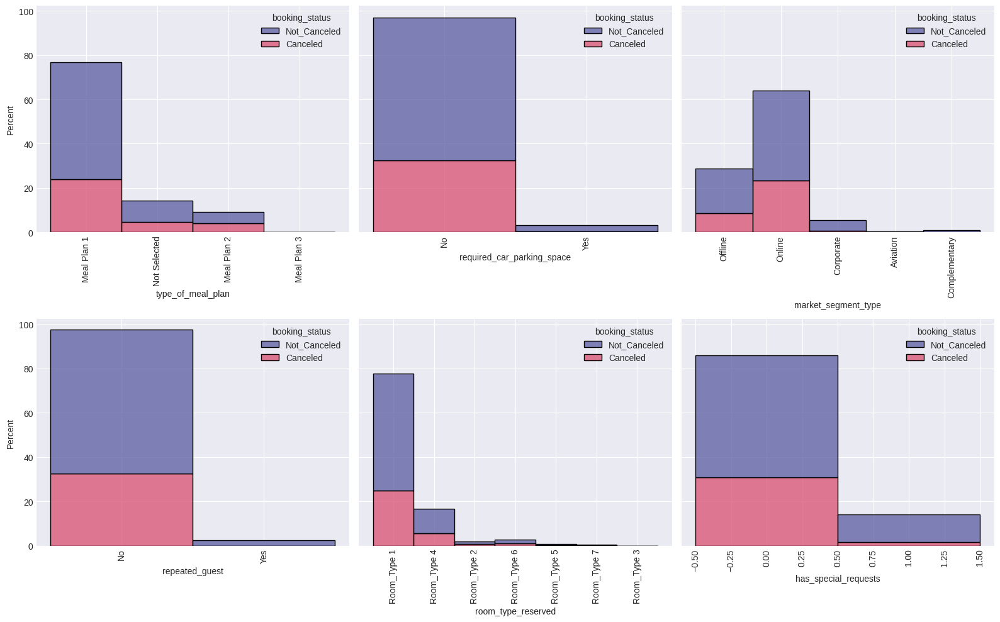

In [20]:
# Draw Categorical distribution charts

fig, ax = plt.subplots(2, math.ceil(len(categorical)/2) , figsize=(16, 10), sharey=True)

for i, label in enumerate(categorical):
    chart = sns.histplot(data=standardized_df, x=label, hue='booking_status',
                         ax=ax[i%2][i%(math.ceil(len(categorical)/2))], discrete=True, stat='percent',
                         multiple='stack')
    plt.setp(chart.get_xticklabels(), rotation = 90)

fig.tight_layout()

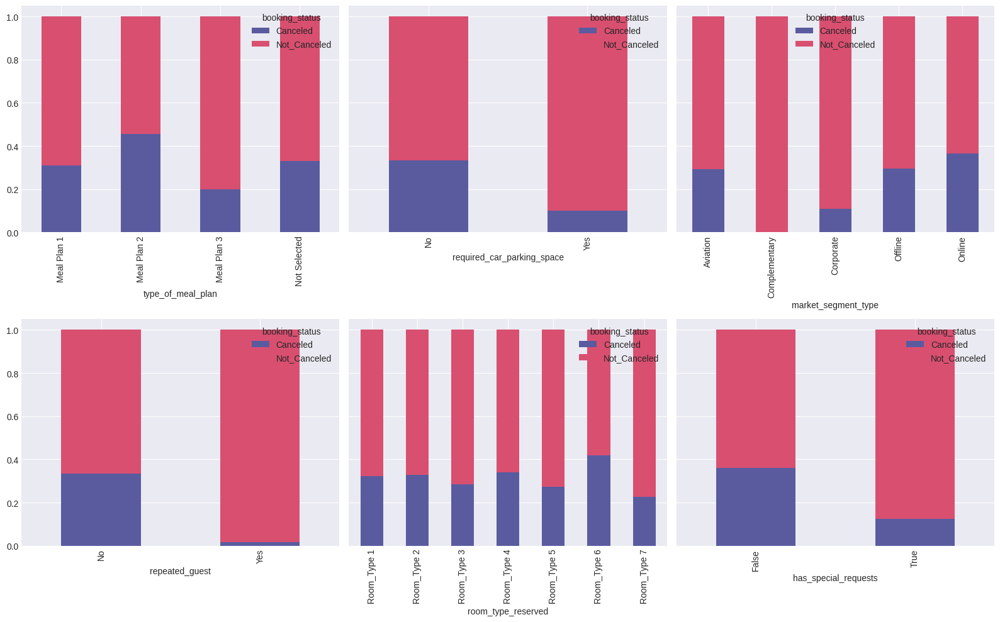

In [21]:
fig, ax = plt.subplots(2, math.ceil(len(categorical)/2) , figsize=(16, 10), sharey=True)

for i, label in enumerate(categorical):
    # Creating crosstab
    crosstb = pd.crosstab(standardized_df[label], standardized_df['booking_status'])
    norm = crosstb.div(crosstb.sum(axis=1),axis=0)
    # Creating barplot
    pl = norm.plot(ax=ax[i%2][i%(math.ceil(len(categorical)/2))], kind="bar", stacked=True, rot=90)
fig.tight_layout()

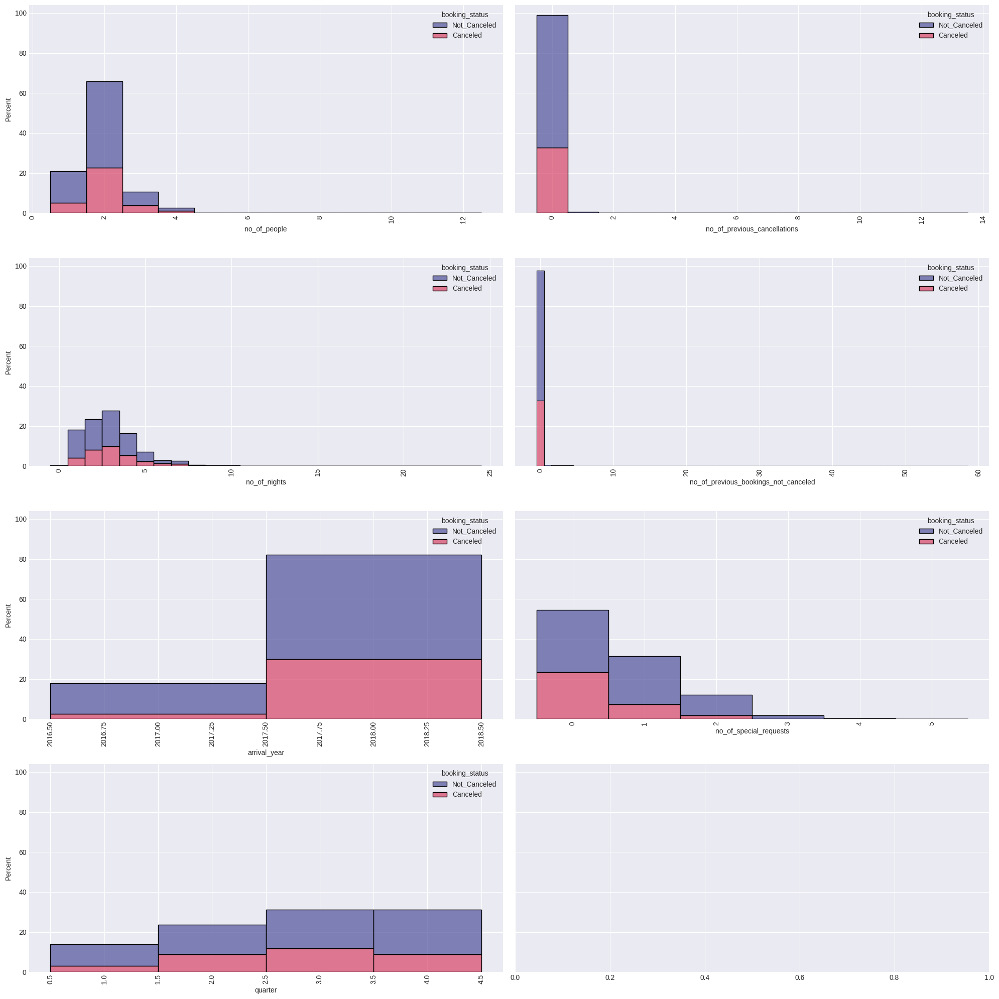

In [22]:
# Draw Categorical distribution charts

fig, ax = plt.subplots(4, math.ceil(len(non_categorical)/4) , figsize=(20, 20), sharey=True)

for i, label in enumerate(non_categorical):
    chart = sns.histplot(data=standardized_df, x=label, hue='booking_status',
                         ax=ax[i%4][int(i/4)], discrete=True, stat='percent',
                         multiple='stack')
    plt.setp(chart.get_xticklabels(), rotation = 90)

fig.tight_layout()

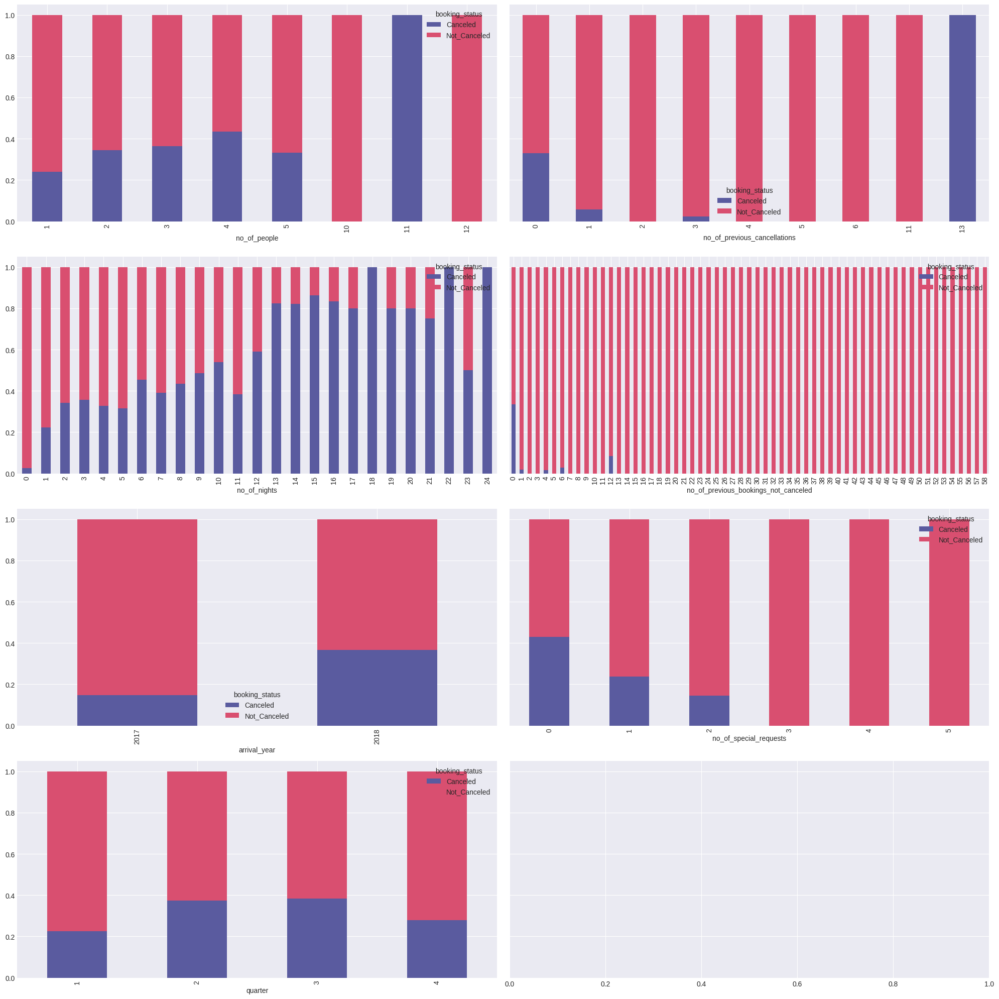

In [23]:
fig, ax = plt.subplots(4, math.ceil(len(non_categorical)/4) , figsize=(20, 20), sharey=True)

for i, label in enumerate(non_categorical):
    # Creating crosstab
    crosstb = pd.crosstab(standardized_df[label], standardized_df['booking_status'])
    norm = crosstb.div(crosstb.sum(axis=1),axis=0)
    # Creating barplot
    pl = norm.plot(ax=ax[i%4][int(i/4)], kind="bar", stacked=True, rot=90)
fig.tight_layout()

In [14]:
# data_encode2 = data.copy()

# these labels must be encoded
labels_to_encode = ['type_of_meal_plan', 'room_type_reserved',
                    'market_segment_type', 'booking_status',
                    'required_car_parking_space' , 'quarter' , 'has_special_requests']

# encoding
for label in labels_to_encode:
    data_encode2[label] = data_encode2[label].astype('category')
    data_encode2[label] = data_encode2[label].cat.codes

# check dataset
data_encode2

,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,quarter,no_of_people,no_of_nights,has_special_requests
0,0,0,0,224,2017,3,0,0,0,65.00,0,1,3,2,3,0
1,2,0,0,5,2018,4,0,0,0,106.68,1,1,3,2,5,0
2,0,0,0,1,2018,4,0,0,0,60.00,0,0,0,1,3,0
3,0,0,0,211,2018,4,0,0,0,100.00,0,0,1,2,2,0
4,2,0,0,48,2018,4,0,0,0,94.50,0,0,1,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,0,0,3,85,2018,4,0,0,0,167.80,1,1,2,3,8,0
36271,0,0,0,228,2018,4,0,0,0,90.95,2,0,3,2,4,1
36272,0,0,0,148,2018,4,0,0,0,98.39,2,1,2,2,8,1
36273,2,0,0,63,2018,4,0,0,0,94.50,0,0,1,2,3,0


In [15]:
  # remove repeated_guest according to it's high crrelation with no_of_previous_cancellations and no_of_previous_bookings_not_canceled
# and this fact that sum of these two variables will give us more data than repeated_guest

print(data_encode2.corr()['repeated_guest'])

data_encode2.drop(columns=['repeated_guest'], inplace=True)

categorical.remove('repeated_guest')

type_of_meal_plan                      -0.06
required_car_parking_space              0.12
room_type_reserved                     -0.04
lead_time                              -0.13
arrival_year                           -0.02
market_segment_type                    -0.31
repeated_guest                          1.00
no_of_previous_cancellations            0.39
no_of_previous_bookings_not_canceled    0.52
avg_price_per_room                     -0.15
no_of_special_requests                 -0.03
booking_status                          0.10
quarter                                 0.00
no_of_people                           -0.18
no_of_nights                           -0.10
has_special_requests                   -0.04
Name: repeated_guest, dtype: float64


# Correlation

<Axes: >

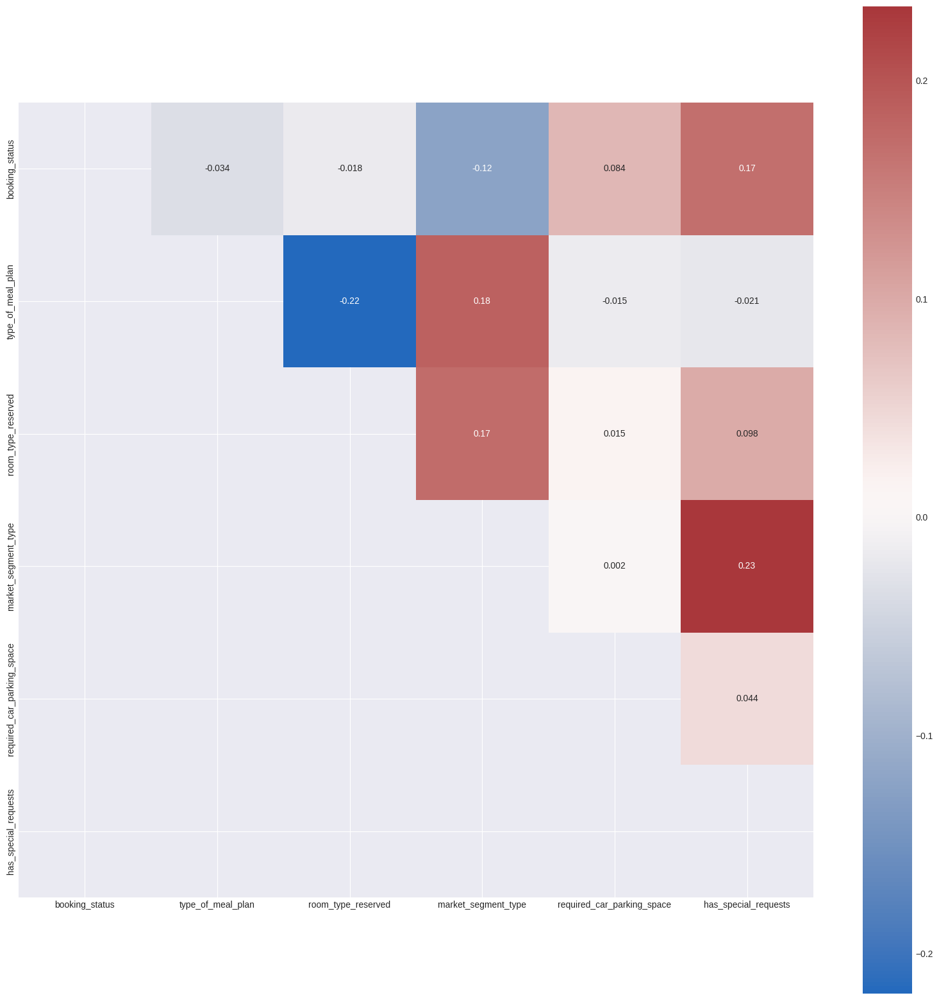

In [26]:
fig = plt.figure(figsize=(20, 20))
corr = data_encode2[['booking_status'] + categorical].corr()
sns.heatmap(corr, mask=np.tril(corr), annot=True, cmap='vlag', square=True)

<Axes: >

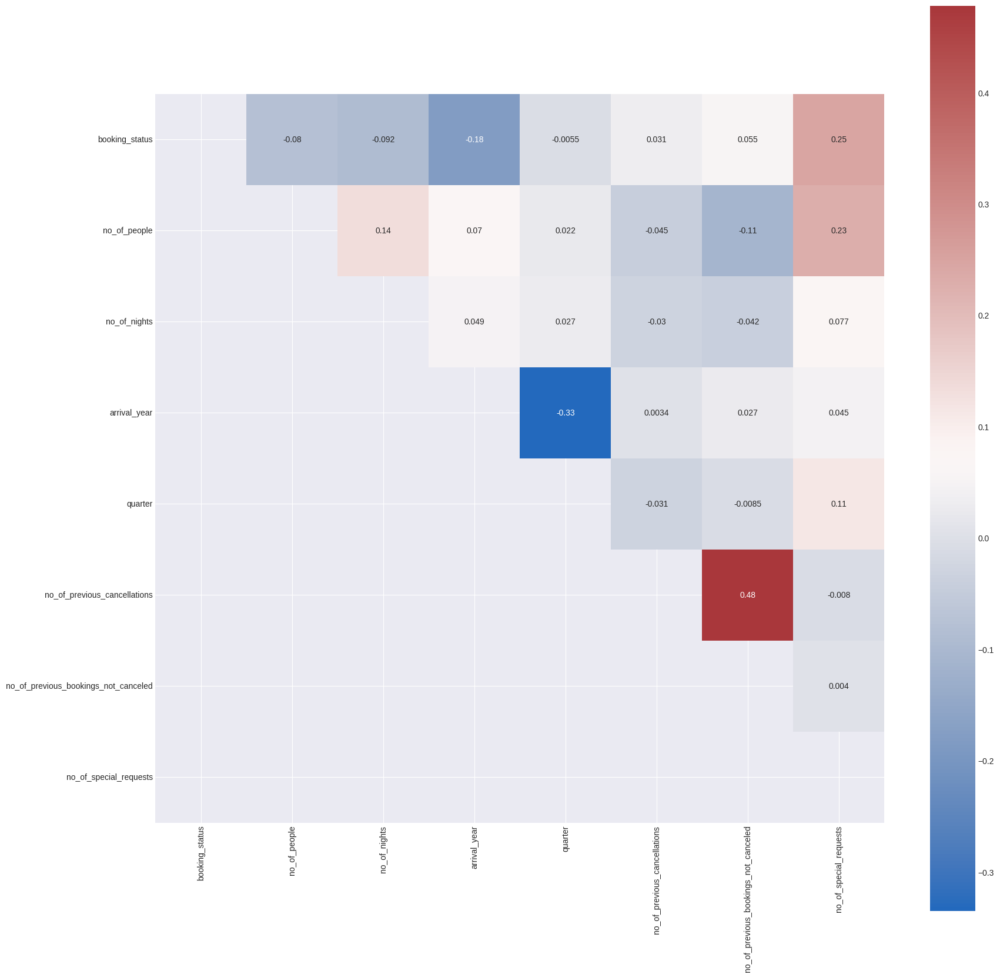

In [27]:
fig = plt.figure(figsize=(20, 20))
corr = data_encode2[['booking_status']+non_categorical].corr()
sns.heatmap(corr, mask=np.tril(corr), annot=True, cmap='vlag', square=True)

<Axes: >

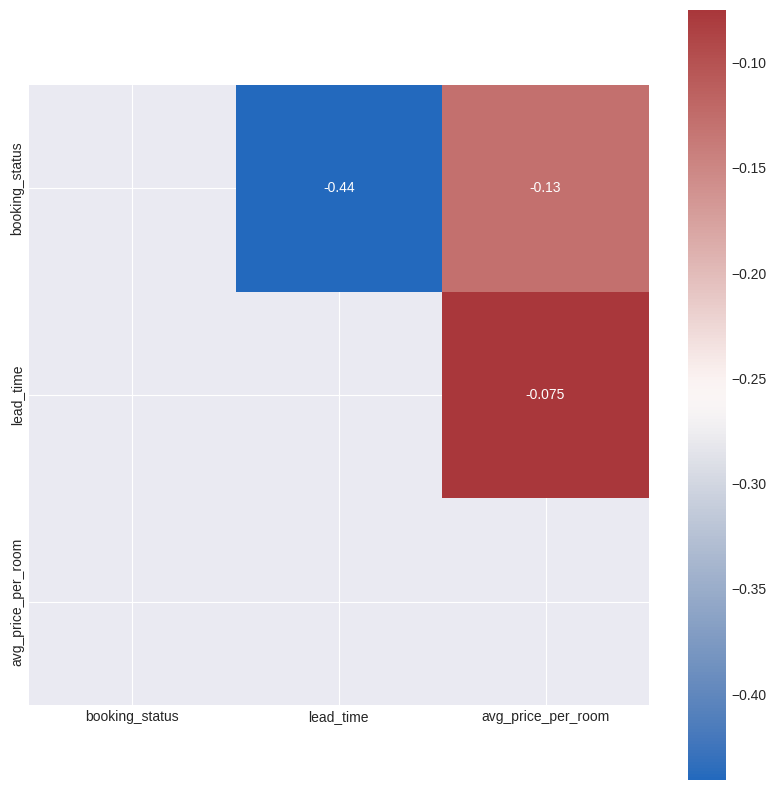

In [28]:
fig = plt.figure(figsize=(10, 10))
corr = data_encode2[['booking_status']+continuous].corr()
sns.heatmap(corr, mask=np.tril(corr), annot=True, cmap='vlag', square=True)

<Axes: >

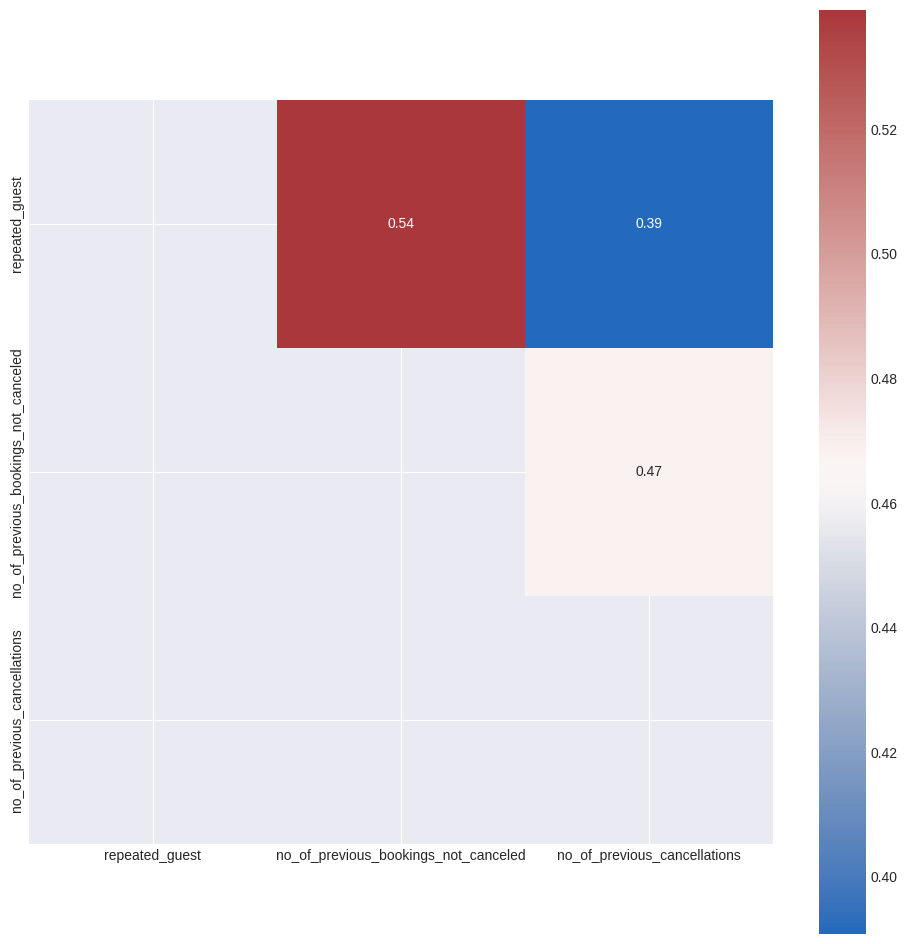

In [29]:
fig = plt.figure(figsize=(12, 12))
corr = data[['repeated_guest' , 'no_of_previous_bookings_not_canceled' , 'no_of_previous_cancellations']].corr()
sns.heatmap(corr, mask=np.tril(corr), annot=True, cmap='vlag', square=True)

In [16]:
## Function to create confusion matrix
def make_confusion_matrix(_y_test,_y_predict,title ,labels=[1, 0]):

    cm=sklearn.metrics.confusion_matrix(_y_test, _y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (7,5))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.title(title)
def get_metrics_score(classifier):

    accuracy_mean = cross_val_score(classifier, X, y, cv=10 , scoring='accuracy').mean()
    precision_mean = cross_val_score(classifier, X, y, cv=10 , scoring='precision').mean()
    f1_mean = cross_val_score(classifier, X, y, cv=10 , scoring='f1').mean()
    recall_mean = cross_val_score(classifier, X, y, cv=10 , scoring='recall').mean()

    print("Precision: {:.2f}".format(precision_mean))
    print("Recall: {:.2f}".format(recall_mean))
    print("F1 Score: {:.2f}".format(f1_mean))
    print("Accuracy Score: {:.2f}".format(accuracy_mean))

def clustering(_X_ , n_clusters):
  kmeans = KMeans(n_clusters=n_clusters, random_state=42)
  cluster_labels = kmeans.fit_predict(_X_)

  # Add the cluster labels as new features
  _X_['cluster_label'] = cluster_labels
  return _X_


In [17]:
data_encode2 = clustering(data_encode2 , 10)
X = data_encode2.drop('booking_status', axis = 1)
y = data_encode2['booking_status']

X_train,X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, test_size = 0.3, random_state = 0)


X

,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,market_segment_type,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,quarter,no_of_people,no_of_nights,has_special_requests,cluster_label
0,0,0,0,224,2017,3,0,0,65.00,0,3,2,3,0,2
1,2,0,0,5,2018,4,0,0,106.68,1,3,2,5,0,4
2,0,0,0,1,2018,4,0,0,60.00,0,0,1,3,0,7
3,0,0,0,211,2018,4,0,0,100.00,0,1,2,2,0,2
4,2,0,0,48,2018,4,0,0,94.50,0,1,2,2,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,0,0,3,85,2018,4,0,0,167.80,1,2,3,8,0,1
36271,0,0,0,228,2018,4,0,0,90.95,2,3,2,4,1,2
36272,0,0,0,148,2018,4,0,0,98.39,2,2,2,8,1,5
36273,2,0,0,63,2018,4,0,0,94.50,0,1,2,3,0,3


# Model Selection

معرفی مجموعه معیارهای ارزیابی و محاسبه آن¬ها و تفسیر نتایج :


Here We Select some Classifiers base on LazyClassifier on lazypredict package result .

Out evaluation metrics are these : Accuracy Score  , Precision Score , Recall Score , F1 Score

we will calculate these metric for each classifer using cross validation

In [32]:
# Run this only on Jupitery NoteBook :

# clf = LazyClassifier(verbose=1, ignore_warnings=True, custom_metric=None)
# models, predictions = clf.fit(X_train, X_test, y_train, y_test)
# models

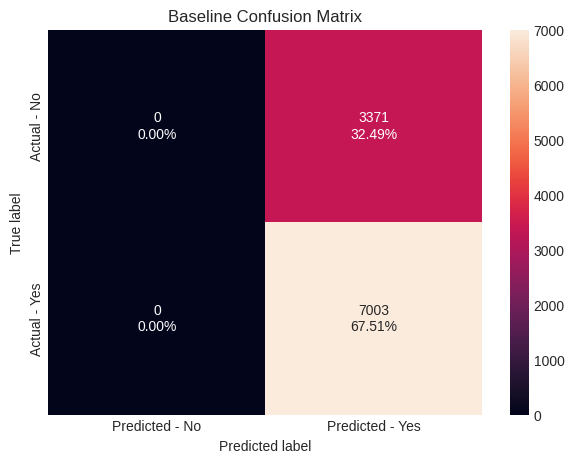

In [33]:
# Base Line Answer :

y_baseline = np.ones(len(y_test))

make_confusion_matrix(y_test , y_baseline , 'Baseline Confusion Matrix')

# Model fitting

## kNN

In [18]:
def knn_classifier(_X_train , _y_train , _X_test , _y_test):


  param_grid = {'n_neighbors' : 5 , 'weights' : 'uniform' , 'algorithm' : 'brute' , 'metric' : 'minkowski'}
  knn = sklearn.neighbors.KNeighborsClassifier(**param_grid)
  knn.fit(_X_train, _y_train)
  knn_y_pred = knn.predict(_X_test)

  make_confusion_matrix(_y_test , knn_y_pred , 'KNN Confusion Matrix')
  get_metrics_score(knn)

# SVC

In [19]:
def svc_classifier(_X_train , _y_train , _X_test , _y_test):

  best_params = {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}

  svc = SVC(**best_params)
  svc.fit(_X_train, _y_train)
  svc_y_pred = svc.predict(_X_test)

  make_confusion_matrix(_y_test , svc_y_pred , 'SVC Confusion Matrix')
  get_metrics_score(svc)


# RandomForest Classifier

In [20]:
def randomforest_classifier(_X_train , _y_train , _X_test , _y_test):

  # Perform a grid search over the hyperparameter grid using 5-fold cross-validation

  # rfc = RandomForestClassifier(random_state=42)

  # param_grid = {
  #     'n_estimators': [50, 100, 200],
  #     'max_depth': [None, 10, 20],
  #     'min_samples_split': [2, 5],
  #     'min_samples_leaf': [1, 2]
  # }

  # grid_search = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=5)
  # grid_search.fit(_X_train, _y_train)
  # print("Best hyperparameters:", grid_search.best_params_)

  # Predict the labels for the test set using the best estimator found by the grid search

  param_grid = {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

  rfc = RandomForestClassifier(**param_grid , random_state=42)
  rfc.fit(_X_train , _y_train)
  rfc_y_pred = rfc.predict(_X_test)


  make_confusion_matrix(_y_test , rfc_y_pred , 'RandomForest Confusion Matrix')
  get_metrics_score(rfc)

# Bagging Classifier

In [21]:
def bagging_classifier(_X_train , _y_train , _X_test , _y_test):

  # param_grid = {
  #     'n_estimators': [10, 20, 30],
  #     'max_samples': [0.5, 0.8, 1.0],
  #     'max_features': [0.5, 0.8, 1.0],
  # }

  # # Initialize BaggingClassifier
  # bagging = BaggingClassifier()

  # # Use GridSearchCV to find the best hyperparameters
  # grid_search = GridSearchCV(estimator=bagging, param_grid=param_grid, cv=5)
  # grid_search.fit(X_train, y_train)

  best_params = {'max_features': 1.0, 'max_samples': 0.5, 'n_estimators': 30}
  bagging = BaggingClassifier(**best_params)
  bagging.fit(_X_train, _y_train)
  bagging_y_pred = bagging.predict(_X_test)
  make_confusion_matrix(_y_test , bagging_y_pred , 'Bagging Classifier Confusion Matrix')
  get_metrics_score(bagging)

## LightGBM

# Optimizing LGBM using `optuna`

In [22]:
def lgbm_classifier(_X_train , _y_train , _X_test , _y_test):

  def objective(trial):
      param = {
          'objective': 'binary',
          'metric': 'binary_logloss',
          'verbosity': -1,
          'boosting_type': 'gbdt',
          'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 1e+2, log=True),
          'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 1e+2, log=True),
          'num_leaves': trial.suggest_int('num_leaves', 2, 256),
          'feature_fraction': trial.suggest_float('feature_fraction', 0.4, 1.0),
          'bagging_fraction': trial.suggest_float('bagging_fraction', 0.4, 1.0),
          'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
          'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
      }
      model = lgb.LGBMClassifier(**param)
      gbm = model.fit(X_train, y_train)
      return model.score(X_train, y_train)

  study = optuna.create_study(direction='maximize')
  study.optimize(objective, n_trials=20)
  lgbm = lgb.LGBMClassifier(**study.best_params, n_estimators=1_000)
  lgbm.fit(_X_train, _y_train)
  lgbm_optimized_y_pred = lgbm.predict(_X_test)

  make_confusion_matrix(_y_test , lgbm_optimized_y_pred , 'LightGBM Confusion Matrix')

  get_metrics_score(lgbm)

In [39]:
# print(f'Best Vlaue: {study.best_value:.1%} @ Trial {study.best_trial.number}')

Precision: 0.84
Recall: 0.90
F1 Score: 0.87
Accuracy Score: 0.82


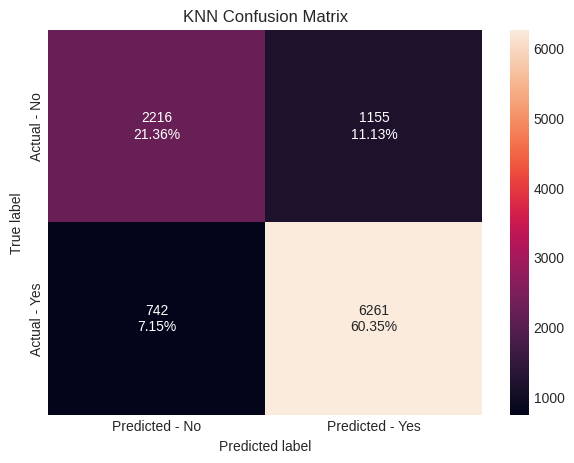

In [40]:
# Before OverSampling
knn_classifier (X_train , y_train , X_test , y_test)

Precision: 0.75
Recall: 0.94
F1 Score: 0.84
Accuracy Score: 0.75


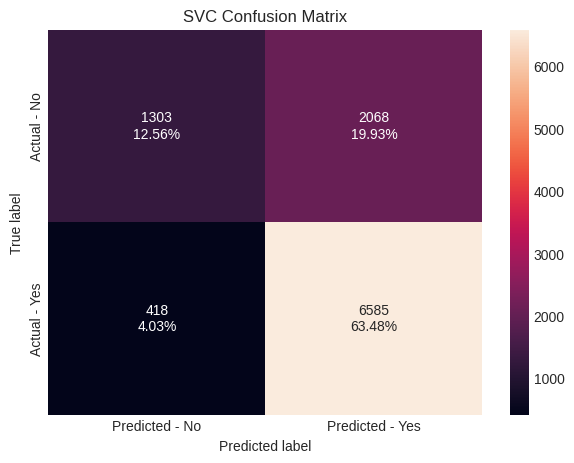

In [41]:
# Before OverSampling
svc_classifier(X_train , y_train , X_test , y_test)

Precision: 0.91
Recall: 0.93
F1 Score: 0.92
Accuracy Score: 0.89


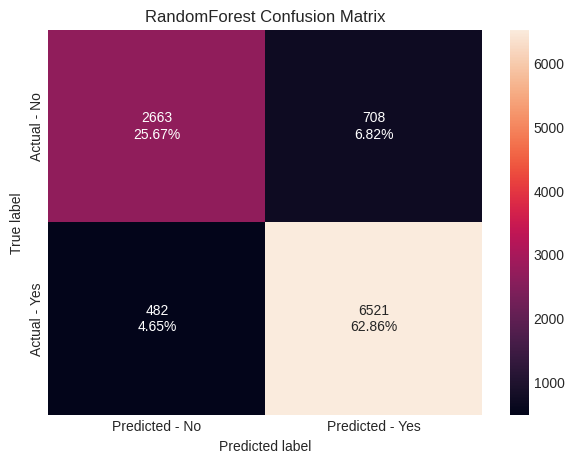

In [42]:
# Before OverSampling

randomforest_classifier(X_train , y_train , X_test , y_test)

[I 2024-05-13 17:36:14,048] A new study created in memory with name: no-name-833ab91f-f37c-42f7-9036-9ac85e991e70
[I 2024-05-13 17:36:14,514] Trial 0 finished with value: 0.8592852716380913 and parameters: {'lambda_l1': 1.034191310471496e-05, 'lambda_l2': 0.0003042033421796571, 'num_leaves': 10, 'feature_fraction': 0.9367388075421328, 'bagging_fraction': 0.6340282076737851, 'bagging_freq': 3, 'min_child_samples': 83}. Best is trial 0 with value: 0.8592852716380913.
[I 2024-05-13 17:36:15,782] Trial 1 finished with value: 0.9343110927494319 and parameters: {'lambda_l1': 0.26094651744733277, 'lambda_l2': 0.012529839413302168, 'num_leaves': 228, 'feature_fraction': 0.5303491667126924, 'bagging_fraction': 0.9650417124456003, 'bagging_freq': 4, 'min_child_samples': 34}. Best is trial 1 with value: 0.9343110927494319.
[I 2024-05-13 17:36:16,686] Trial 2 finished with value: 0.8998967155546375 and parameters: {'lambda_l1': 0.0004320377760727816, 'lambda_l2': 0.00010073523439934786, 'num_leave

[LightGBM] [Warning] feature_fraction is set=0.8729428118897922, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8729428118897922
[LightGBM] [Warning] lambda_l2 is set=2.117142370940665e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117142370940665e-06
[LightGBM] [Warning] lambda_l1 is set=0.00022342846212980016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00022342846212980016
[LightGBM] [Warning] bagging_fraction is set=0.8025853801543519, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025853801543519
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.8729428118897922, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8729428118897922
[LightGBM] [Warning] lambda_l2 is set=2.117142370940665e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.117142370940665e-06
[LightGBM] [Warn

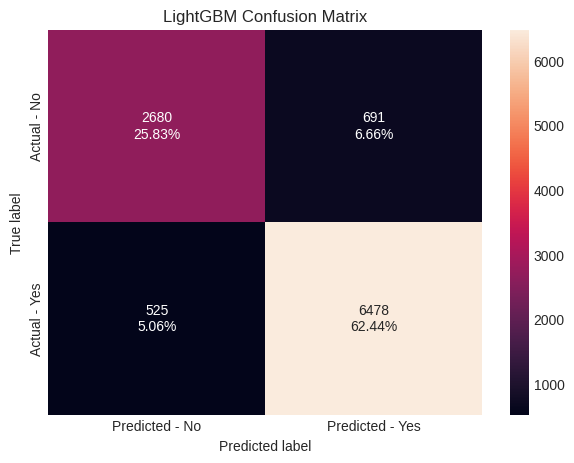

In [43]:
# Before OverSampling

lgbm_classifier(X_train , y_train , X_test , y_test)

Precision: 0.90
Recall: 0.93
F1 Score: 0.92
Accuracy Score: 0.89


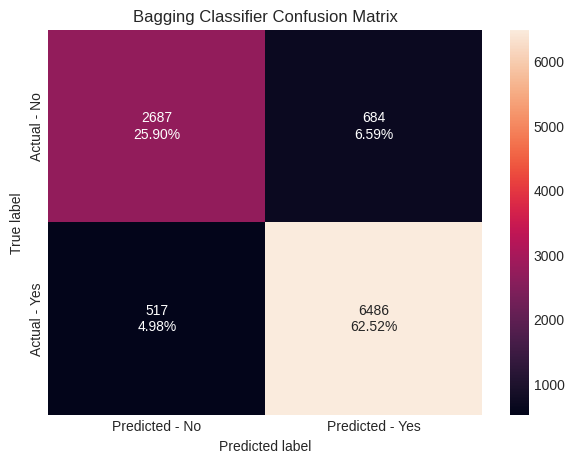

In [44]:
# Before OverSampling

bagging_classifier(X_train , y_train , X_test , y_test)

# After OverSampling

In [23]:
X = data_encode2.drop('booking_status', axis = 1)
X = X.values
y = data_encode2['booking_status']

ros = imblearn.over_sampling.RandomOverSampler(random_state=0)
X_resampled, y_resampled = ros.fit_resample(X, y)
# ax = sns.countplot(x=y)

scaler = sklearn.preprocessing.StandardScaler()
X_resampled_standard = scaler.fit_transform(X_resampled)

X_train,X_test, y_train, y_test = sklearn.model_selection.train_test_split(X_resampled_standard, y_resampled, test_size = 0.3, random_state = 0)

# KNN

Precision: 0.84
Recall: 0.90
F1 Score: 0.87
Accuracy Score: 0.82


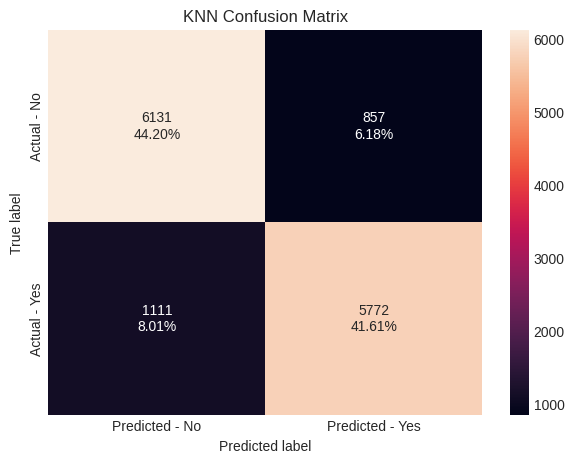

In [46]:
# After OverSampling :

knn_classifier(X_train , y_train , X_test , y_test)

# SVC

Precision: 0.75
Recall: 0.94
F1 Score: 0.84
Accuracy Score: 0.75


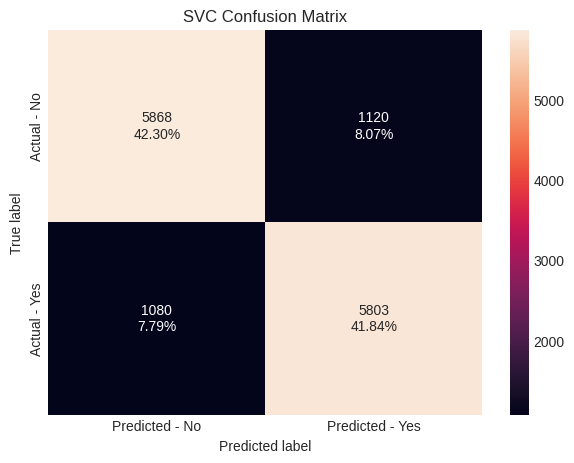

In [24]:
# َ After OverSampling :

svc_classifier(X_train , y_train , X_test , y_test)

# RandomForest Classifier

Precision: 0.91
Recall: 0.93
F1 Score: 0.92
Accuracy Score: 0.89


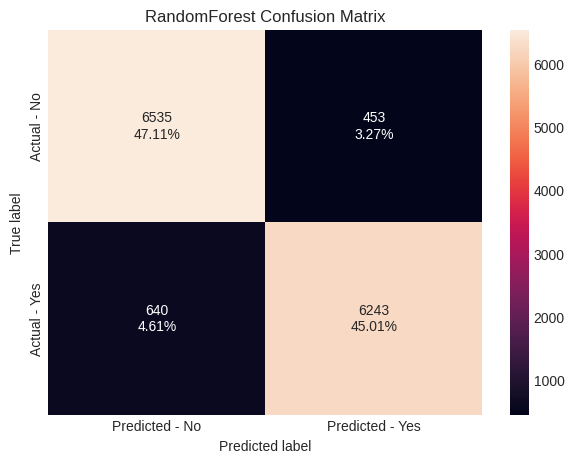

In [25]:
# After OverSampling

randomforest_classifier(X_train , y_train , X_test , y_test)


# Optimized LightGBM

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] feature_fraction is set=0.6632517161905228, colsample_bytree=1.0 will be ignored. Current value: featur

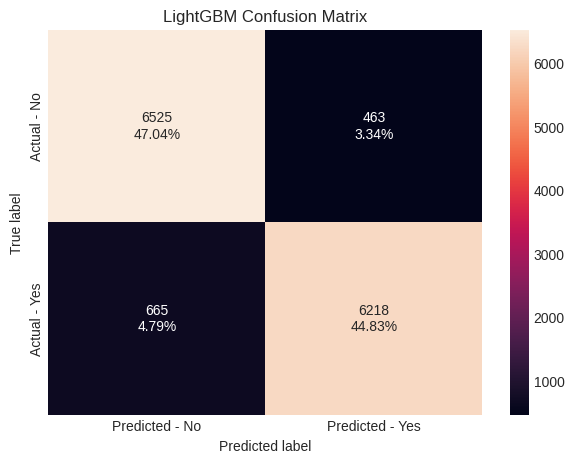

In [26]:
# After OverSampling

lgbm_classifier(X_train , y_train , X_test , y_test)

Precision: 0.91
Recall: 0.93
F1 Score: 0.92
Accuracy Score: 0.89


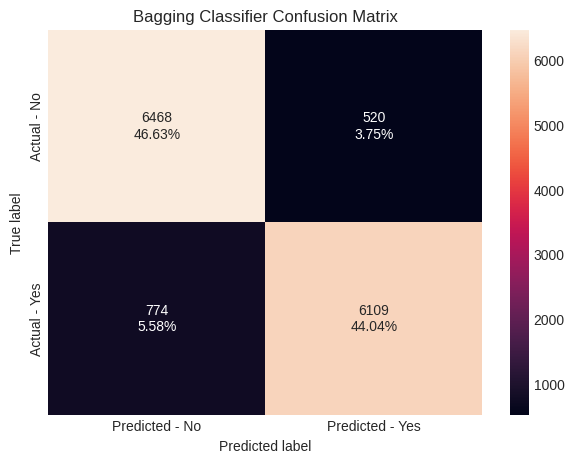

In [27]:
# After OverSampling

bagging_classifier(X_train , y_train , X_test , y_test)

# The Best Model Before OverFitting : RandomForest
# metrics score :
{

  Precision: 0.90

  Recall: 0.93 ,
  
  F1 Score: 0.92 ,
  
  Accuracy Score: 0.89 ,
  
}
# best HyperParameters :
{'max_depth': None , 'min_samples_leaf': 1 , 'min_samples_split': 2 , 'n_estimators': 200}

# The Best Model Before OverFitting : RandomForest
# metrics score :
{

  Precision: 0.90
  
  Recall: 0.93
  
  F1 Score: 0.92
  
  Accuracy Score: 0.89

}

# برآورد هزینه های خطا :
 فرض کنید که هتل دار به اشتباه فردی را که رزروش را کنسل نمیکند طبق پیش بینی مدل ما تشخیص دهد که این فرد رزروش را کنسل خواهد کرد . در اینصورت ممکن است آن اتاق در آن مدت زمان خالی بماند .
 حالت دوم را اینطور فرض کنید که هتل دار طبق نظر مدل پیش بینی کند که یک فرد رزروش را کنسل نمیکند و برای همین در صورت پر شدن هتل رزرو های دیگر را رد کند . اما بعد از آن فرد رزروش را قطع کند و باز هم در این حالت هم اتاقش خالی خواهد ماند

